## Polymer Melt Flow Rate

This case study is based upon the excellent example below:

http://apmonitor.com/pds/index.php/Main/PolymerMeltFlowRate 

Along with its github repository:

https://github.com/APMonitor/pds

and license:

https://github.com/APMonitor/pds/blob/main/LICENSE

In particular, as described on the web page above:

Polymer properties such as density, melt index, and melt flow rate must be kept within tight specifications for each grade. This case study is to analyze polymer production data to predict melt flow rate.

**Background:** There are gas phase and liquid slurry reactors that create polymers (polyethylene, polypropylene, polystyrene, and others) from chemical building blocks known as monomers (C2=, C3=, C4=, iC5=, and others). A catalyst is injected with the monomers under carefully controlled temperature and pressure conditions to cause a reaction that grows the polymer chains. Hydrogen is a chain transfer agent to stop the growth of the polymer chain. If the polymer chains grow too long then the polymer is too viscous for manufacturing in films, injection molding, or other applications.

This case study focuses on measurements of Melt Flow Rate (MFR) to determine the polymer viscosity based on reactor conditions. An accurate model is desirable so that the infrequent lab samples (every 2-8 hours) are supplemented with a virtual and continuous "soft sensor". A model that runs in real-time simulation alongside the physical reactor is called a digital twin.

| Label | Data File Tag   | Description |
|------|------|------|
|   Time  | | Timestamp of the measurements|
|   C3  | 513FC31103.pv| Propylene (C3=) Feed Rate (kg/hr)|
|   H2R  | 513HC31114-5.mv| Hydrogen to C3= Ratio|
|   Pressure  | 513PC31201.pv| Reactor Pressure (bar)|
|   Level  | 513LC31202.pv| Reactor Bed Level (m)|
|   C2  | 513FC31409.pv| Ethylene (C2=) Flow (kg/hr)|
|   Cat  | 513FC31114-5.pv| Catalyst Feed Rate (kg/hr)|
|   Temp  | 513TC31220.pv| Reactor Temperature|
|   MFR  | MFR| Melt Flow Rate (gm/10min)|

**References**

Hedengren, J. D. (2021, December 16). Polymer Melt Flow Rate, Machine Learning for Engineers. Retrieved from http://apmonitor.com/pds/index.php/Main/PolymerMeltFlowRate 



# Naive solution

### Import Polymer MFR Data


Don't worry, the data has been cached on the github page for this class so you can access it directly by url. Easy!

In [75]:
url = 'https://raw.githubusercontent.com/rcpaffenroth/DS595-Machine-Learning-for-Engineering-and-Science-Applications/main/data/polymer_reactor.txt'

In [76]:
import pandas as pd
data = pd.read_csv(url)

In [77]:
data

,Unnamed: 0,513FC31103.pv,513HC31114-5.mv,513PC31201.pv,513LC31202.pv,513FC31409.pv,513FC31114-5.pv,513TC31220.pv,MFR
0,04-05-18 19:45,24856.584,0.153,30.414835,79.657906,50850.578,0.163994,80.399605,3.4
1,04-05-18 21:45,25537.250,0.153,30.527121,78.532608,42229.813,0.129739,78.861328,3.2
2,04-05-18 23:45,25689.266,0.153,30.356180,78.842636,45335.852,0.150003,78.818115,3.2
3,04-06-18 1:45,25098.754,0.153,30.894308,79.173500,43077.016,0.151543,79.022720,3.1
4,04-06-18 3:45,24853.941,0.150,30.680647,78.677299,40404.387,0.122582,79.038483,3.3
...,...,...,...,...,...,...,...,...,...
2559,12-10-18 9:45,24437.988,0.185,31.025928,77.189499,24022.730,0.103966,81.783371,12.3
2560,12/17/2018 16:45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.5
2561,12/17/2018 18:45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0
2562,12/27/2018 5:45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.7


In [78]:
data = data.set_axis(['Time','C3','H2R','Pressure','Level','C2','Cat','Temp','MFR'], axis=1)

In [79]:
data

,Time,C3,H2R,Pressure,Level,C2,Cat,Temp,MFR
0,04-05-18 19:45,24856.584,0.153,30.414835,79.657906,50850.578,0.163994,80.399605,3.4
1,04-05-18 21:45,25537.250,0.153,30.527121,78.532608,42229.813,0.129739,78.861328,3.2
2,04-05-18 23:45,25689.266,0.153,30.356180,78.842636,45335.852,0.150003,78.818115,3.2
3,04-06-18 1:45,25098.754,0.153,30.894308,79.173500,43077.016,0.151543,79.022720,3.1
4,04-06-18 3:45,24853.941,0.150,30.680647,78.677299,40404.387,0.122582,79.038483,3.3
...,...,...,...,...,...,...,...,...,...
2559,12-10-18 9:45,24437.988,0.185,31.025928,77.189499,24022.730,0.103966,81.783371,12.3
2560,12/17/2018 16:45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.5
2561,12/17/2018 18:45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0
2562,12/27/2018 5:45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.7


Nice, now I know what they are. 🙂

### Regression Modeling

Now, we have the data and we know what they are. We learned a lot from Randy's 🧙 lecture and can't wait to try the machine learning algorithms. Let's start.

#### Divide Data

What is the first step? Wow, Randy 🧙  said we need to divide the training set and the test set.

"Data is divided into train and test sets to separate a fraction of the rows for evaluating classification or regression models. A typical split is 80% for training and 20% for testing, although the range depends on how much data is available and the objective of the study."

The `train_test_split` is a function in `sklearn` for the specific purpose of splitting data into train and test sets.

```python
from sklearn.model_selection import train_test_split
train,test = train_test_split(ds, test_size=0.2, shuffle=True)
```

There are options such as `shuffle=True` to randomize the selection in each set. 

In [80]:
from sklearn.model_selection import train_test_split
train,test = train_test_split(data, test_size=0.2, shuffle=True, random_state=1)

Can't wait any longer to run the model?


#### Run model
Let's try linear regression using sklearn!

In [81]:
from sklearn import linear_model
method = linear_model.LinearRegression()

What columns are used as features? What columns are used as labels?
Don't know? Then let's use them all first, except for time, since time is not important in this case.

**Features：**C3, H2R, Pressure, Level, C2, Cat, Temp

**label：** MFR


Wow! We forgot to check if there are any null values in the dataset. 😞


data.isnull() is used to check if there is null value in the dataset. We can sum them by using sum().

data.info() and data.describe() are usually used to check the properties and basic statistics of the data.

In [82]:
train.isnull().sum().sum()

431

In [83]:
test.isnull().sum().sum()

49

In [84]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2051 entries, 1093 to 1061
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Time      2051 non-null   object 
 1   C3        1981 non-null   float64
 2   H2R       2048 non-null   float64
 3   Pressure  1979 non-null   float64
 4   Level     1979 non-null   float64
 5   C2        1979 non-null   float64
 6   Cat       1981 non-null   float64
 7   Temp      1979 non-null   float64
 8   MFR       2051 non-null   float64
dtypes: float64(8), object(1)
memory usage: 160.2+ KB


In [85]:
train.describe()

,C3,H2R,Pressure,Level,C2,Cat,Temp,MFR
count,1981.000000,2048.000000,1979.000000,1979.000000,1979.000000,1981.000000,1979.000000,2051.000000
mean,25342.035768,0.178165,30.659640,77.659450,42662.841313,0.138533,80.137342,8.229449
std,1701.939333,0.079322,0.432810,0.930477,11375.945853,0.042061,0.846325,5.084612
min,16106.025000,0.000000,26.946344,74.575958,9610.464800,0.022162,77.760117,1.500000
25%,24397.914000,0.135000,30.444627,76.994495,34932.478500,0.113763,79.666259,3.700000
50%,25394.648000,0.172000,30.618645,77.501343,41954.355000,0.132688,80.035500,4.400000
75%,26434.447000,0.200000,30.928010,78.233005,50109.232500,0.156993,80.497383,12.900000
max,30083.688000,0.980000,32.674332,83.841675,106073.610000,0.677979,91.566544,38.000000


Yes, null values do exist in the dataset, let's delete them first.

data.dropna() is used to remove the rows that contain null value.

In [86]:
train_dropna = train.dropna()
test_dropna = test.dropna()

In [87]:
train_dropna.isnull().sum().sum()

0

In [88]:
test_dropna.isnull().sum().sum()

0

Now, let's try to run the model again!

In [89]:
model = method.fit(train_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy(),train_dropna['MFR'].to_numpy())
#, 'Pressure', 'Level', 'C2', 'Cat', 'Temp'

Great!!! The model was successfully fit！ 🙂 Now, we can evaluate the performance on test set.

In [90]:
from sklearn.metrics import mean_squared_error
r2 = method.score(test_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy()), test_dropna['MFR'].to_numpy())

print('R^2: ' + str(r2))
print('mse: ' + str(mse))

R^2: 0.4262449911995734
mse: 14.935927259730693


Ok, we already see things are interesting.  There are two different metrics (R^2 and mse)!   Hmmm....

## **Question 1** **(10 points)**

**Part 1 (5 points)**

What do R^2 and mse mean? Which is better for describing the performance of your algorithm?  Why?

**Part 2 (5 points)**  

Try different variables to fit the model and test its performance.   What do you notice?  Are some worse and some better?

Hint: 
model = method.fit(train_dropna[['Your selected variable 1', 'Your selected variable 2']].to_numpy(),train_dropna['MFR'].to_numpy())

1.1 - R^2 is a value between 0 and 100%. It is the fraction of response variance captured by the regression model. This can be found by dividing the total variance explained by the model by the total variance. An R^2 value of 100% would mean the two variables are perfectly correlated. 
MSE is the mean squared error, the residual error, found by the average of the squared errors. A large MSE would mean a large variance and 0 would mean the two variables are perfectly correlated. MSE can vary if the response variable is scaled which is why R^2 can give a better idea of the performance of an algorithm. 



In [91]:
#### Comparing C3 and H2R
model = method.fit(train_dropna[['C3', 'H2R']].to_numpy(),train_dropna['MFR'].to_numpy())
#, 'Pressure', 'Level', 'C2', 'Cat', 'Temp'

from sklearn.metrics import mean_squared_error
r2 = method.score(test_dropna[['C3', 'H2R']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['C3', 'H2R']].to_numpy()), test_dropna['MFR'].to_numpy())

print('R^2 (C3,H2R): ' + str(r2))
print('mse (C3,H2R): ' + str(mse))

###Comparing Pressure and Level
model = method.fit(train_dropna[['Pressure', 'Level']].to_numpy(),train_dropna['MFR'].to_numpy())
#, 'Pressure', 'Level', 'C2', 'Cat', 'Temp'

from sklearn.metrics import mean_squared_error
r2 = method.score(test_dropna[['Pressure', 'Level']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['Pressure', 'Level']].to_numpy()), test_dropna['MFR'].to_numpy())

print('R^2 (Pressure, Level): ' + str(r2))
print('mse (Pressure, Level): ' + str(mse))

###Comparing C3 and C2
model = method.fit(train_dropna[['C3', 'C2']].to_numpy(),train_dropna['MFR'].to_numpy())
#, 'Pressure', 'Level', 'C2', 'Cat', 'Temp'

from sklearn.metrics import mean_squared_error
r2 = method.score(test_dropna[['C3', 'C2']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['C3', 'C2']].to_numpy()), test_dropna['MFR'].to_numpy())

print('R^2 (C3, C2): ' + str(r2))
print('mse (C3, C2): ' + str(mse))

###Comparing Pressure and Temp
model = method.fit(train_dropna[['Pressure', 'Temp']].to_numpy(),train_dropna['MFR'].to_numpy())
#, 'Pressure', 'Level', 'C2', 'Cat', 'Temp'

from sklearn.metrics import mean_squared_error
r2 = method.score(test_dropna[['Pressure', 'Temp']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['Pressure', 'Temp']].to_numpy()), test_dropna['MFR'].to_numpy())

print('R^2 (Pressure, Temp): ' + str(r2))
print('mse (Pressure, Temp): ' + str(mse))

R^2 (C3,H2R): 0.21550973885089308
mse (C3,H2R): 20.421764162002876
R^2 (Pressure, Level): 0.20218829378202274
mse (Pressure, Level): 20.76854655429804
R^2 (C3, C2): 0.15846689340205755
mse (C3, C2): 21.906697238392315
R^2 (Pressure, Temp): 0.22836784385617925
mse (Pressure, Temp): 20.087043387262355


1.2 - When comparing 2 variables, there was very little variation between each combination tested. Some were slightly better like comparing C3 and C2, but the others had neglidgible differences.

# Solution with Feature Engineering

How about we create a heatmap to show the correlation between the variables?

In [92]:
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px

Still remember? Removing null values.

In [93]:
data = data.dropna()

we can create a heatmap using seaborn.heatmap()

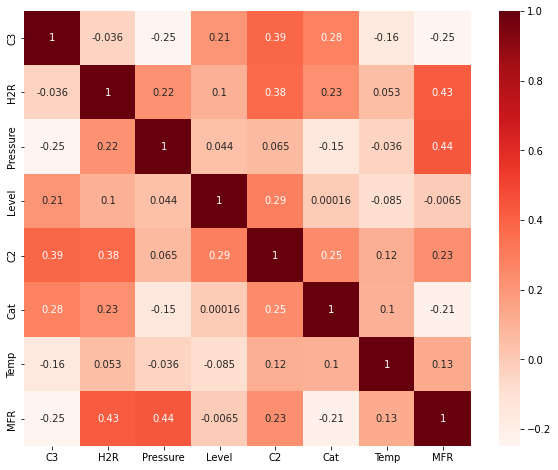

In [94]:
plt.figure(figsize=(10,8))
cor = data.corr()
sns.heatmap(cor, annot=True,cmap=plt.cm.Reds)
plt.show()

## **Question 2** **(20 points)**

**Part 1 (5 points)**
What does correlation mean?

**Part 2 (10 points)**
What are your observations? Which variables are strongly correlated with MFR and which variables are weakly correlated with MFR?

**Part 3 (5 points)**
Is a variable with a large *negative* correlation useful or not?

2.1 - Correlation is the relationship between two variables. This relationship is causal. A high correlation would mean the variables are closely related. Understading this relationship could help in finding one variable from the other.

2.2 - Temp and Level all weakly correlate as they are the closest to 0. H2R and Pressure strongly correlate. as they are the closest to 1.

2.3 - A variable with a negative correlation would mean that as one increases, the other deacreases. This relationship is just as helpful as a high positive correlation. A low correlation would be close to 0.

### Pair Plot

A pair plot shows the correlation between variables.

```python
sns.pairplot(data)
```

It has bar distributions on the diagonal and scatter plots on the off-diagonal. A pair plot also shows a different color (`hue`) by category `w`. Pair plots show correlations between pairs of variables that may be related and gives a good indication of features (explanatory inputs) that are used for classification or regression. Generate your own pair plot of the data.

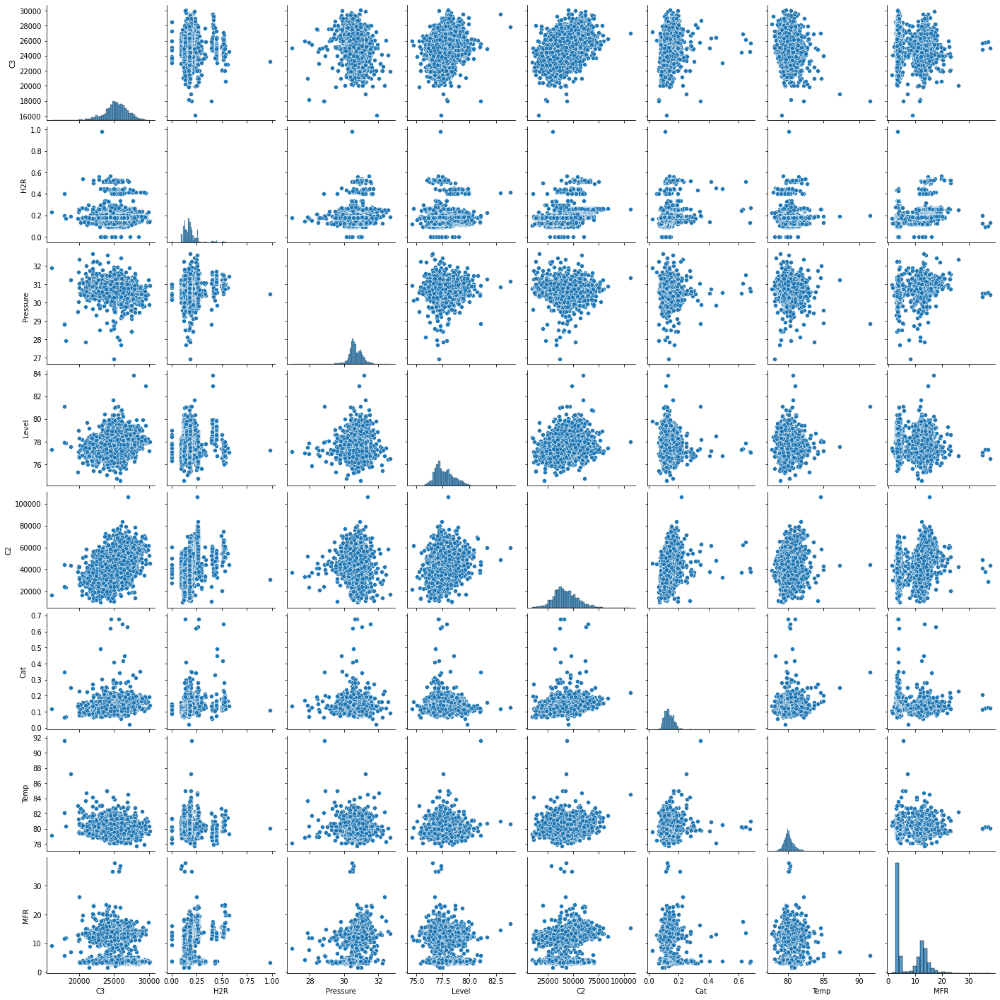

In [95]:
sns.pairplot(data)

### Joint Plot

Want to change the plot style? No problem! 👌

A joint plot shows two variables, with the univariate and joint distributions.

```python
sns.jointplot(x='H2R',y='MFR',data=data,kind="kde")
```

Generate your own joint plot with the data. Try `kind='reg'`, `'kde'`, and `'hex'` to see different joint plot styles.

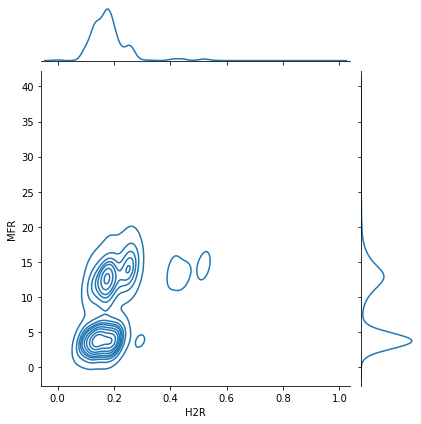

In [96]:
sns.jointplot(x='H2R',y='MFR',data=data,kind="kde")

### Data Analysis with `pandas-profiling`

Pandas Profiling is a data analysis tool for a more in-depth summary of the data than the `descibe()` function. [Install the package](https://pandas-profiling.github.io/pandas-profiling/docs/master/rtd/pages/installation.html) with:

```python
pip install --user pandas-profiling[notebook]
jupyter nbextension enable --py widgetsnbextension
```

**This idea is important!** You will need to install more packages than Colab provides, and this is an example of doing that.

NOTE:  You need to restart the Kernel before proceeding. The install only needs to run once.  We will talk about this in class.

In [97]:
!pip install --upgrade pandas-profiling==2.13

In [98]:
from pandas_profiling import ProfileReport

"Time" breaks the profiling. Remove this column from the data before generating your profile report.

In [99]:
data = data.drop(['Time'], axis=1)

In [100]:
profile = ProfileReport(data, minimal=False)

View the profile report in the Jupyter Notebook with `profile.to_widgets()`.
Explore the profile report and familiarize yourself with it.

ProfileReport takes a little time to render the results, please be patient.

![?](https://memegenerator.net/img/instances/65352160.jpg)

In [101]:
profile.to_widgets()

/usr/local/lib/python3.7/dist-packages/pandas_profiling/profile_report.py:432: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  "Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60)."


Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

## **Question 3** **(10 points)**

Find the two most "relevant" variables to MFR and fit them with linear regression. Cut and paste their "Interaction" plots here.  Why do you think they are relevant?

Compare the results (r^2 and mse) using these variables with your previous experiments.


3 - The two most relavant variables to MFR are Pressure and H2R. These two variables correlate the most with MFR. However, the R^2 and MSE values are very similar to the others, H2R having the highest MSE and lowest R^2, meaning the closest correlation.

If we compare with other pairs like Pressure, Temp or C2, C3 or Pressure, level. The Pressure, H2R has the lowest MSE and higher R^2. 

In [102]:
#### Comparing Pressure
model = method.fit(train_dropna[['Pressure']].to_numpy(),train_dropna['MFR'].to_numpy())
#, 'Pressure', 'Level', 'C2', 'Cat', 'Temp'

from sklearn.metrics import mean_squared_error
r2 = method.score(test_dropna[['Pressure']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['Pressure']].to_numpy()), test_dropna['MFR'].to_numpy())

print('R^2: (Prssure) ' + str(r2))
print('mse: (Prssure)' + str(mse))

###Comparing H2R
model = method.fit(train_dropna[['H2R']].to_numpy(),train_dropna['MFR'].to_numpy())
#, 'Pressure', 'Level', 'C2', 'Cat', 'Temp'

from sklearn.metrics import mean_squared_error
r2 = method.score(test_dropna[['H2R']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['H2R']].to_numpy()), test_dropna['MFR'].to_numpy())

print('R^2: (H2R)' + str(r2))
print('mse: (H2R)' + str(mse))


###Comparing Pressure and H2R
model = method.fit(train_dropna[['Pressure', 'H2R']].to_numpy(),train_dropna['MFR'].to_numpy())
#, 'Pressure', 'Level', 'C2', 'Cat', 'Temp'

from sklearn.metrics import mean_squared_error
r2 = method.score(test_dropna[['Pressure', 'H2R']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['Pressure', 'H2R']].to_numpy()), test_dropna['MFR'].to_numpy())

print('R^2 (Pressure, H2R): ' + str(r2))
print('mse (Pressure, H2R): ' + str(mse))


R^2: (Prssure) 0.2019090680741491
mse: (Prssure)20.775815327202643
R^2: (H2R)0.1856638538044687
mse: (H2R)21.19870895763556
R^2 (Pressure, H2R): 0.3275641298547487
mse (Pressure, H2R): 17.504776584559064


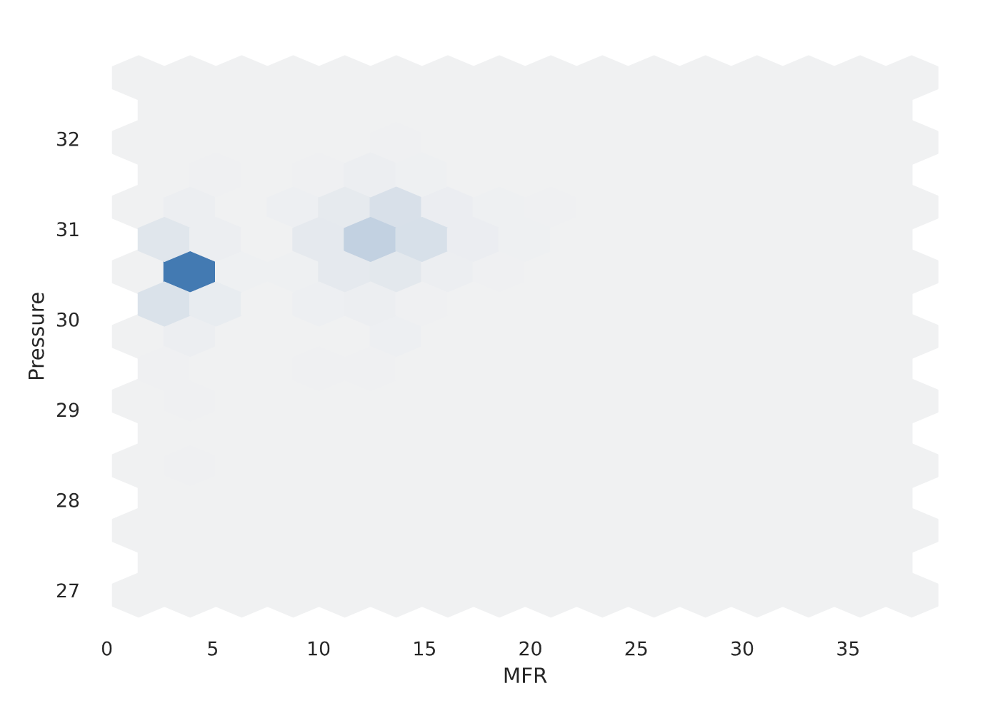

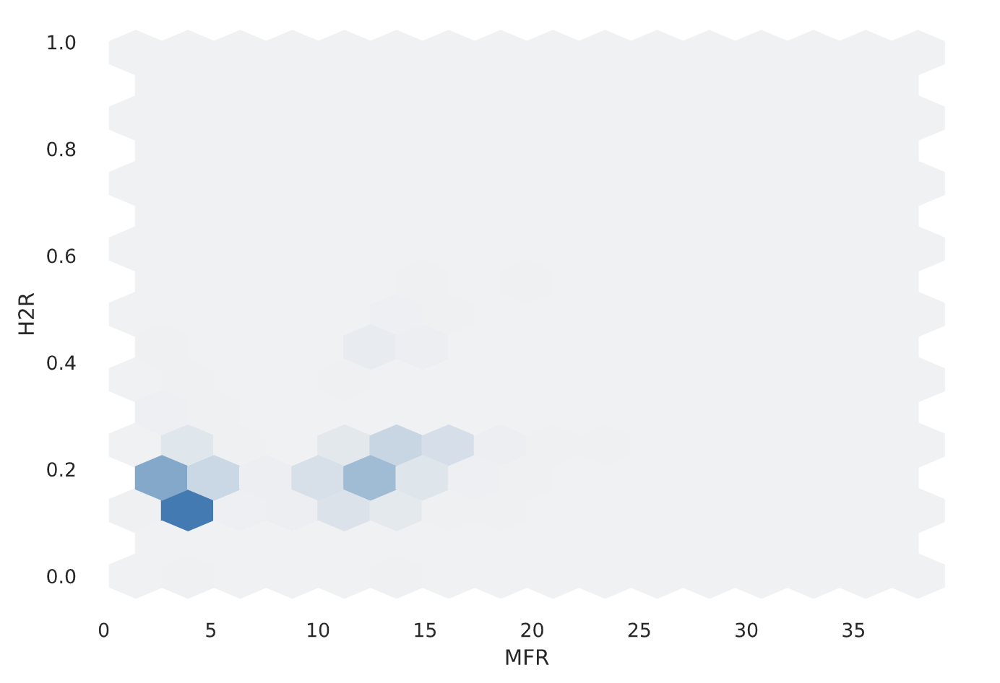

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


<BarContainer object of 7 artists>

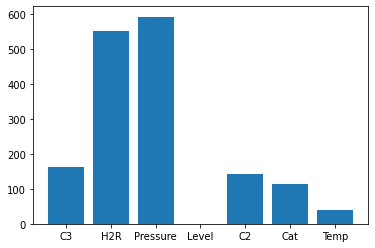

In [103]:
x=data[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']]
z=data[['MFR']]

from sklearn.feature_selection import SelectKBest, f_regression
import matplotlib.pylab as plt
best = SelectKBest(score_func=f_regression, k='all')
fit = best.fit(x,z)
plt.bar(x=x.columns,height=fit.scores_)

Tired of manually selecting variables? We can use the model to select best features (variables) automatically.

### Select Best Features

We can rank the features to determine the best set that predicts `MFR`.

```python
from sklearn.feature_selection import SelectKBest, f_regression
best = SelectKBest(score_func=f_regression, k='all')
fit = best.fit(x,z)
plt.bar(x=x.columns,height=fit.scores_)
```

There is additional information on [Select K Best Features](https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.SelectKBest.html).

## **Question 4** **(10 points)**

Based on the above results, select the variables you think are related to MFR and fit them with linear regression. Compare the results with the previous experiments.  What do observe?


4 - When comparing the graphs of H2R and Pressure, H2R is parallel to the x axis. This means that MFR does not depend on H2R. Pressure is the most relavant variable to MFR. 

In [104]:
import numpy as np
import matplotlib.pylab as py

In [105]:
print(data['MFR'])
print(data['H2R'])

0        3.4
1        3.2
2        3.2
3        3.1
4        3.3
        ... 
2555    11.8
2556    11.2
2557    11.4
2558    13.5
2559    12.3
Name: MFR, Length: 2484, dtype: float64
0       0.153
1       0.153
2       0.153
3       0.153
4       0.150
        ...  
2555    0.180
2556    0.180
2557    0.250
2558    0.185
2559    0.185
Name: H2R, Length: 2484, dtype: float64


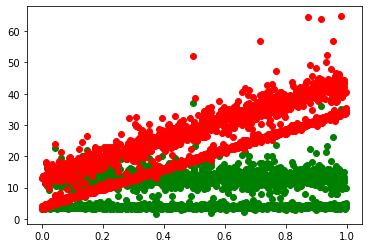

In [109]:
number_of_points = 2484
x = np.random.uniform(0, 1, size=number_of_points)
mu = 0.0
sigma = 0.1
noise = np.random.normal(loc=mu, scale=sigma, size=number_of_points)

true_a = data['H2R']
true_b = data['Pressure']
true_c = data['MFR']
y = true_a*x + true_c
py.scatter(x, y, color='green')


y1 = true_b*x + true_c
#y2 = true_a*x + true_b
#y3 = true_a*x + true_b*x + true_c
py.scatter(x, y1, color='red')
#py.scatter(x, y2, color='cyan')
#py.scatter(x, y3, color='purple')

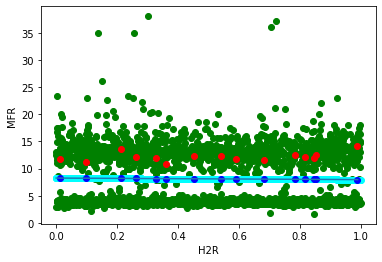

In [110]:
def generate_data(number_of_points = 2484, true_a = data['H2R'], true_c =  data['MFR'], mu = 0.0, sigma = 0.1, degree=1):
  x = np.random.uniform(0, 1, size=number_of_points)
  y = true_a*x**degree + true_c

  return x,y

def create_model(x, y, degree=1):
  # Lots of math magic in here!
  z = np.polyfit(x, y, deg=degree)
  y_hat_function = np.poly1d(z)
  return y_hat_function

def evaluate_model(model, x_train, y_train, x_test, y_test):
  py.scatter(x_train, y_train, color='green')
  py.scatter(x_train, model(x_train), color='cyan')

  py.scatter(x_test, y_test, color='red')
  py.scatter(x_test, model(x_test), color='blue')

  x_on_grid = np.arange(min([min(x_train), min(x_test)]), max([max(x_train), max(x_test)]), 0.01)
  y_predictions_on_grid = model(x_on_grid)

  py.plot(x_on_grid, y_predictions_on_grid)

  py.xlabel('H2R');
  py.ylabel('MFR');

np.random.seed(123)
number_of_points = 2484
x, y = generate_data(number_of_points = number_of_points, true_a = data['H2R'], true_c =  data['MFR'], mu = 0.0, sigma = 0.05, degree=1)

test_size = 15
x_train = x[:(number_of_points-test_size)]
y_train = y[:(number_of_points-test_size)]

x_test = x[(number_of_points-test_size):]
y_test = y[(number_of_points-test_size):]

model = create_model(x_train, y_train, degree=1)
evaluate_model(model, x_train, y_train, x_test=x_test, y_test=y_test)

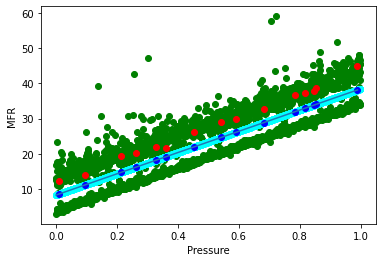

In [112]:
def generate_data(number_of_points = 2484, true_b = data['Pressure'], true_c =  data['MFR'], mu = 0.0, sigma = 0.1, degree=1):
  x = np.random.uniform(0, 1, size=number_of_points)
  y = true_b*x**degree + true_c

  return x,y

def create_model(x, y, degree=1):
  # Lots of math magic in here!
  z = np.polyfit(x, y, deg=degree)
  y_hat_function = np.poly1d(z)
  return y_hat_function

def evaluate_model(model, x_train, y_train, x_test, y_test):
  py.scatter(x_train, y_train, color='green')
  py.scatter(x_train, model(x_train), color='cyan')

  py.scatter(x_test, y_test, color='red')
  py.scatter(x_test, model(x_test), color='blue')

  x_on_grid = np.arange(min([min(x_train), min(x_test)]), max([max(x_train), max(x_test)]), 0.01)
  y_predictions_on_grid = model(x_on_grid)

  py.plot(x_on_grid, y_predictions_on_grid)

  py.xlabel('Pressure');
  py.ylabel('MFR');

np.random.seed(123)
number_of_points = 2484
x, y = generate_data(number_of_points = number_of_points, true_b = data['Pressure'], true_c =  data['MFR'], mu = 0.0, sigma = 0.05, degree=1)

test_size = 15
x_train = x[:(number_of_points-test_size)]
y_train = y[:(number_of_points-test_size)]

x_test = x[(number_of_points-test_size):]
y_test = y[(number_of_points-test_size):]

model = create_model(x_train, y_train, degree=1)
evaluate_model(model, x_train, y_train, x_test=x_test, y_test=y_test)

# Solution with Feature Engineering + Data processing

There are several graphical techniques to help detect outliers. A box or histogram plot shows outlying points. Make one now and examine it for outliers in each variable.

In [ ]:
import numpy as np
data['lnMFR'] = np.log(data['MFR'])
#sns.pairplot(data)
from sklearn.preprocessing import StandardScaler
s = StandardScaler()
ds = s.fit_transform(data)
ds = pd.DataFrame(ds,columns=data.columns)
data.describe()



,C3,H2R,Pressure,Level,C2,Cat,Temp,MFR,lnMFR
count,2484.000000,2484.000000,2484.000000,2484.000000,2484.00000,2484.000000,2484.000000,2484.000000,2484.000000
mean,25304.758777,0.183725,30.663706,77.651055,42525.14000,0.138522,80.144365,8.036594,1.881821
std,1706.180093,0.072155,0.423345,0.919600,11331.86896,0.041885,0.823554,5.076463,0.635992
min,16106.025000,0.000000,26.946344,74.575958,9610.46480,0.022162,77.760117,1.500000,0.405465
25%,24361.490000,0.140000,30.446129,76.992151,34795.53500,0.113757,79.677458,3.700000,1.308333
50%,25364.311500,0.175000,30.622631,77.494477,41550.56250,0.132971,80.044308,4.300000,1.458615
75%,26397.439750,0.202000,30.925738,78.210867,50010.29500,0.157029,80.496296,12.800000,2.549445
max,30083.688000,0.980000,32.674332,83.841675,106073.61000,0.677979,91.566544,38.000000,3.637586


In [ ]:
ds.describe()

,C3,H2R,Pressure,Level,C2,Cat,Temp,MFR,lnMFR
count,2.484000e+03,2.484000e+03,2.484000e+03,2.484000e+03,2.484000e+03,2.484000e+03,2.484000e+03,2.484000e+03,2.484000e+03
mean,-9.377004e-17,-3.793485e-16,6.259709e-15,1.839877e-14,8.346338e-16,-1.321630e-16,-7.362423e-15,-2.042560e-16,1.343084e-16
std,1.000201e+00,1.000201e+00,1.000201e+00,1.000201e+00,1.000201e+00,1.000201e+00,1.000201e+00,1.000201e+00,1.000201e+00
min,-5.392506e+00,-2.546762e+00,-8.782689e+00,-3.344623e+00,-2.905196e+00,-2.778650e+00,-2.895655e+00,-1.287887e+00,-2.321813e+00
25%,-5.529655e-01,-6.061041e-01,-5.140507e-01,-7.166558e-01,-6.822494e-01,-5.913705e-01,-5.670561e-01,-8.544271e-01,-9.019048e-01
50%,3.491115e-02,-1.209396e-01,-9.704346e-02,-1.703025e-01,-8.602056e-02,-1.325425e-01,-1.215193e-01,-7.362108e-01,-6.655613e-01
75%,6.405543e-01,2.533303e-01,6.190813e-01,6.088786e-01,6.606732e-01,4.419455e-01,4.274177e-01,9.385206e-01,1.049948e+00
max,2.801516e+00,1.103784e+01,4.750333e+00,6.733216e+00,5.609072e+00,1.288212e+01,1.387217e+01,5.903607e+00,2.761229e+00


In [ ]:
from sklearn.model_selection import train_test_split
train_processed,test_processed = train_test_split(ds, test_size=0.2, shuffle=True, random_state=1)

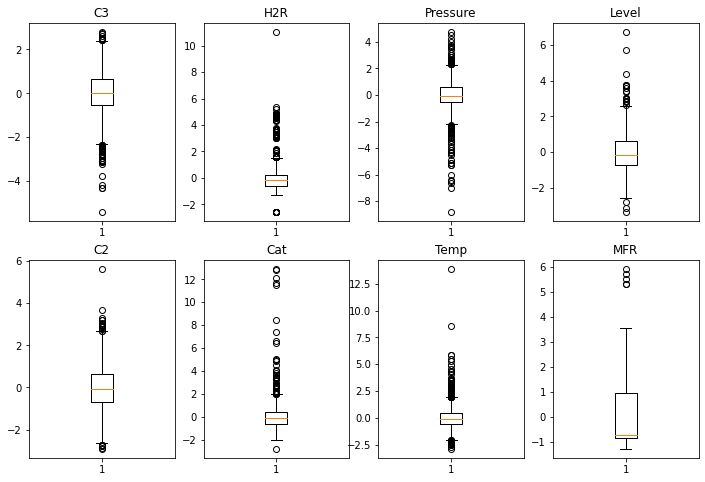

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(12,8))
for i,c in enumerate(data.columns):
    if i<=7:
        plt.subplot(2,4,i+1)
        plt.title(c)
        plt.boxplot(ds[c])
plt.show()

Remove outliers by removing select rows such as with:

```python
data = data[data['H2R']<0.7]
data = data[data['H2R']>0.01]
```

to keep only values of `H2R` (Hydrogen to Monomer ratio) that are between 0.01 and 0.7.

Show the boxplot again to verify that the data set does not have the outliers you removed.

## **Question 5** **(10 points)**

Are there any other outliers in other variables? If so, please remove them.  How did you go about defining outliers?

5 - Points we considered to be outliers, were those that stood alone, well outside any cluster of points. If we removed all the points outside the 'whiskers', we would be removing too much data for our model to be accurate. Source: https://datavizcatalogue.com/methods/box_plot.html

In [ ]:
ds1 = ds.copy()

In [ ]:
ds1.describe()

,C3,H2R,Pressure,Level,C2,Cat,Temp,MFR,lnMFR
count,2.484000e+03,2.484000e+03,2.484000e+03,2.484000e+03,2.484000e+03,2.484000e+03,2.484000e+03,2.484000e+03,2.484000e+03
mean,-9.377004e-17,-3.793485e-16,6.259709e-15,1.839877e-14,8.346338e-16,-1.321630e-16,-7.362423e-15,-2.042560e-16,1.343084e-16
std,1.000201e+00,1.000201e+00,1.000201e+00,1.000201e+00,1.000201e+00,1.000201e+00,1.000201e+00,1.000201e+00,1.000201e+00
min,-5.392506e+00,-2.546762e+00,-8.782689e+00,-3.344623e+00,-2.905196e+00,-2.778650e+00,-2.895655e+00,-1.287887e+00,-2.321813e+00
25%,-5.529655e-01,-6.061041e-01,-5.140507e-01,-7.166558e-01,-6.822494e-01,-5.913705e-01,-5.670561e-01,-8.544271e-01,-9.019048e-01
50%,3.491115e-02,-1.209396e-01,-9.704346e-02,-1.703025e-01,-8.602056e-02,-1.325425e-01,-1.215193e-01,-7.362108e-01,-6.655613e-01
75%,6.405543e-01,2.533303e-01,6.190813e-01,6.088786e-01,6.606732e-01,4.419455e-01,4.274177e-01,9.385206e-01,1.049948e+00
max,2.801516e+00,1.103784e+01,4.750333e+00,6.733216e+00,5.609072e+00,1.288212e+01,1.387217e+01,5.903607e+00,2.761229e+00


In [ ]:
ds1 = ds1[ds1['H2R']<10]
ds1 = ds1[ds1['H2R']>-2]
ds1 = ds1[ds1['C2']<5]
ds1 = ds1[ds1['Temp']<7.5]
ds1 = ds1[ds1['Level']<5]
ds1 = ds1[ds1['Cat']<10]
ds1 = ds1[ds1['C3']>-5]
ds1 = ds1[ds1['Pressure']>-8]

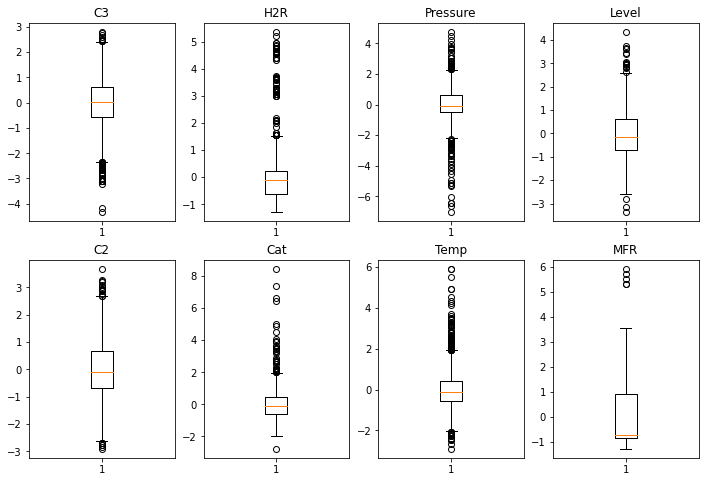

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(12,8))
for i,c in enumerate(data.columns):
    if i<=7:
        plt.subplot(2,4,i+1)
        plt.title(c)
        plt.boxplot(ds1[c])
plt.show()

In [ ]:
ds1.describe()


,C3,H2R,Pressure,Level,C2,Cat,Temp,MFR,lnMFR
count,2460.000000,2460.000000,2460.000000,2460.000000,2460.000000,2460.000000,2460.000000,2460.000000,2460.000000
mean,0.004129,0.000633,0.000694,-0.004814,-0.001666,-0.025388,-0.009277,-0.002765,-0.003060
std,0.987892,0.955326,0.980271,0.983943,0.993829,0.829815,0.937782,1.000020,1.000151
min,-4.310607,-1.271473,-6.998354,-3.344623,-2.905196,-2.778650,-2.895655,-1.287887,-2.321813
25%,-0.552185,-0.606104,-0.515679,-0.720869,-0.683625,-0.591371,-0.567056,-0.854427,-0.901905
50%,0.035952,-0.120940,-0.101725,-0.166465,-0.084273,-0.132197,-0.122071,-0.736211,-0.665561
75%,0.640554,0.239469,0.615238,0.608879,0.660673,0.440348,0.426348,0.918818,1.037614
max,2.801516,5.354489,4.750333,4.348641,3.662351,8.434796,5.887669,5.903607,2.761229


# Important question!

Who controls the features that you process?  As you truck with the features provided by the original experiment?

**NO!!!!**

You have the power!  For example, any invertible transformation of the data can lead to new features or even new targets!   Actually any transformation whatsoever can lead to new features and targets.  Invertible just means that you can always recover your original data :-) 

For example, we can apply log transformation to MFR and try and predict that instead.  Since the log is invertible, we can just predict that, get an prediction, and then apply the inverse of the log (the exponential map).

Create a new column for the natural log of (MFR) as `lnMFR`.

In [ ]:
import numpy as np
ds1['lnMFR'] = np.log(ds1['MFR'])

/usr/local/lib/python3.7/dist-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


Check the results after log transformation

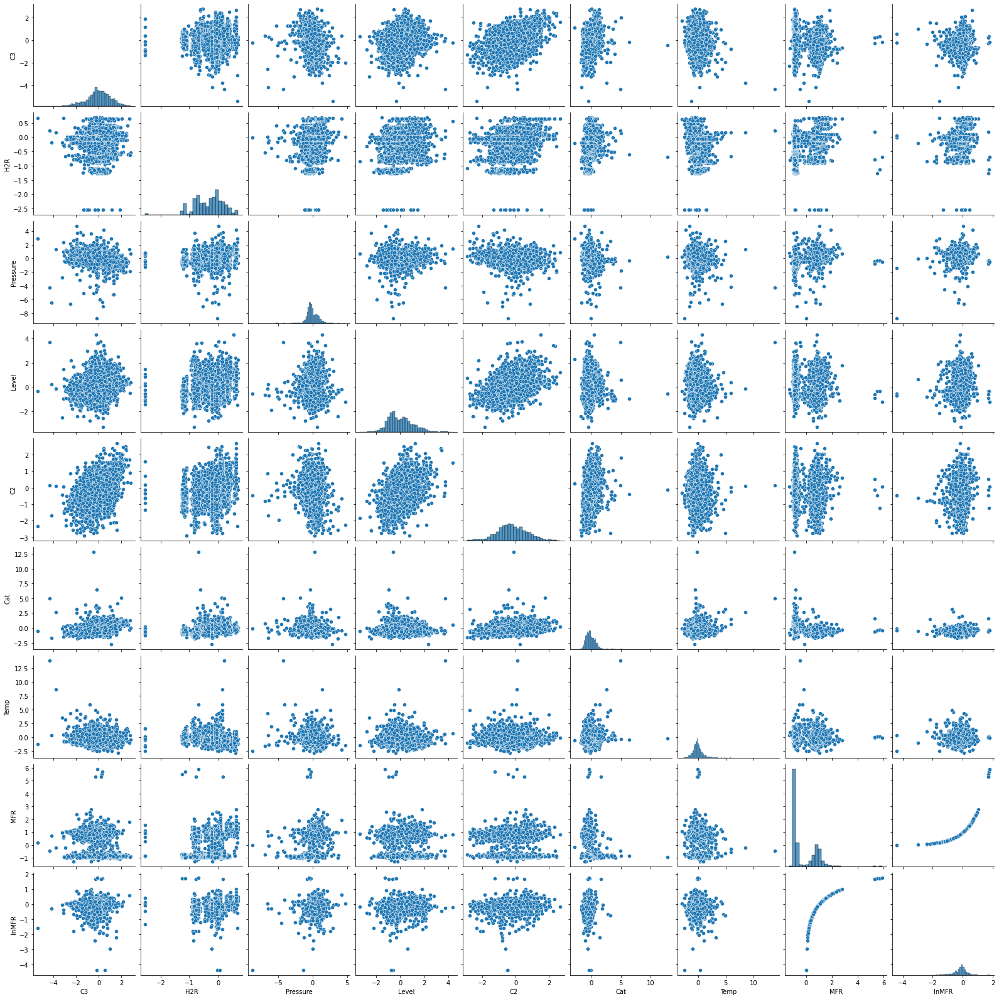

In [ ]:
sns.pairplot(ds1)

## **Question 6** (10 points)

Pick one or two different functions and apply the to MFR and see if a transformed MFR is easier to predict.  Does transforming MFR change what inputs give good predictions?


6 - A transformed MFR was easier to predict. This does not change which inputs give good predictions, Pressure is still the best predictor of MFR. 

In [ ]:
print(ds1['MFR'])
print(ds1['Pressure'])

0      -0.913535
1      -0.952941
2      -0.952941
3      -0.972643
4      -0.933238
          ...   
2478    0.780899
2479    0.741493
2480    0.623277
2482    1.076440
2483    0.840007
Name: MFR, Length: 2106, dtype: float64
0      -0.587985
1      -0.322697
2      -0.726564
3       0.544824
4       0.040026
          ...   
2478    0.278879
2479    1.518691
2480   -2.758665
2482   -6.612896
2483    0.855792
Name: Pressure, Length: 2106, dtype: float64


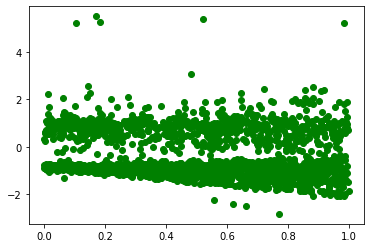

In [ ]:
number_of_points = 2106
x = np.random.uniform(0, 1, size=number_of_points)
mu = 0.0
sigma = 0.1
noise = np.random.normal(loc=mu, scale=sigma, size=number_of_points)

true_a = ds1['H2R']
true_b = ds1['Pressure']
true_c = ds1['MFR']
y = true_a*x + true_c
py.scatter(x, y, color='green')

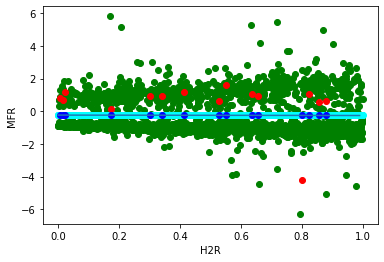

In [ ]:
def generate_data(number_of_points = 2106, true_b = ds1['Pressure'], true_c =  ds1['MFR'], mu = 0.0, sigma = 0.1, degree=1):
  x = np.random.uniform(0, 1, size=number_of_points)
  y = true_b*x**degree + true_c

  return x,y

def create_model(x, y, degree=1):
  # Lots of math magic in here!
  z = np.polyfit(x, y, deg=degree)
  y_hat_function = np.poly1d(z)
  return y_hat_function

def evaluate_model(model, x_train, y_train, x_test, y_test):
  py.scatter(x_train, y_train, color='green')
  py.scatter(x_train, model(x_train), color='cyan')

  py.scatter(x_test, y_test, color='red')
  py.scatter(x_test, model(x_test), color='blue')

  x_on_grid = np.arange(min([min(x_train), min(x_test)]), max([max(x_train), max(x_test)]), 0.01)
  y_predictions_on_grid = model(x_on_grid)

  py.plot(x_on_grid, y_predictions_on_grid)

  py.xlabel('H2R');
  py.ylabel('MFR');

np.random.seed(123)
number_of_points = 2106
x, y = generate_data(number_of_points = number_of_points, true_b = ds1['Pressure'], true_c =  ds1['MFR'], mu = 0.0, sigma = 0.05, degree=1)

test_size = 15
x_train = x[:(number_of_points-test_size)]
y_train = y[:(number_of_points-test_size)]

x_test = x[(number_of_points-test_size):]
y_test = y[(number_of_points-test_size):]

model = create_model(x_train, y_train, degree=1)
evaluate_model(model, x_train, y_train, x_test=x_test, y_test=y_test)

## **Question 7** (10 points)

Just like using transformations on the target (MFR in this case), you can use transformations on the inputs.  Can you predict a transformed MFR from a set of transformed inputs?

Ok, things start to explode now with so many combinations.  Just try a few :-)

7 - Yes, you can predict a transformed MFR from a set of transformed inputs.

### One important transformation:  Scaling the data

Scale data with the Standard Scalar from scikit-learn.

```python
from sklearn.preprocessing import StandardScaler
s = StandardScaler()
ds = s.fit_transform(data)
```

In [ ]:
from sklearn.preprocessing import StandardScaler
s = StandardScaler()
ds = s.fit_transform(data)

The value `ds` is returned as a `numpy` array so we need to convert it back to a `pandas` `DataFrame`.

```python
ds = pd.DataFrame(ds,columns=data.columns)
```

Re-use the column names from `data`.

In [ ]:
ds = pd.DataFrame(ds,columns=data.columns)

Now, we can check the results before/after scaling.

In [ ]:
data.describe()

,C3,H2R,Pressure,Level,C2,Cat,Temp,MFR,lnMFR
count,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000
mean,25325.503035,0.324063,30.901041,77.472395,55477.008965,0.156093,80.444236,13.705986,2.561240
std,1285.522479,0.102500,0.392125,0.891240,11330.581326,0.043342,0.875298,3.601619,0.391148
min,21987.635000,0.252000,29.605696,74.761528,10298.933000,0.054921,77.935677,2.800000,1.029619
25%,24558.013750,0.260000,30.696967,76.938268,49308.713000,0.134760,79.839647,12.875000,2.555282
50%,25322.444500,0.263000,30.926240,77.267185,56193.121000,0.151513,80.414177,13.900000,2.631889
75%,26053.558750,0.414250,31.123872,77.989497,62893.722750,0.168265,81.000237,15.300000,2.727853
max,29480.027000,0.980000,32.572243,79.957237,84018.063000,0.491741,83.010849,23.300000,3.148453


In [ ]:
ds.describe()

,C3,H2R,Pressure,Level,C2,Cat,Temp,MFR,lnMFR
count,2.840000e+02,2.840000e+02,2.840000e+02,2.840000e+02,2.840000e+02,2.840000e+02,2.840000e+02,2.840000e+02,2.840000e+02
mean,9.303982e-16,5.035096e-16,-1.446417e-14,1.041166e-14,-3.799777e-16,-2.634825e-16,3.287277e-15,-5.848217e-16,3.533949e-16
std,1.001765e+00,1.001765e+00,1.001765e+00,1.001765e+00,1.001765e+00,1.001765e+00,1.001765e+00,1.001765e+00,1.001765e+00
min,-2.601090e+00,-7.042984e-01,-3.309229e+00,-3.047048e+00,-3.994307e+00,-2.338410e+00,-2.871008e+00,-3.033424e+00,-3.922614e+00
25%,-5.980791e-01,-6.261119e-01,-5.213493e-01,-6.003646e-01,-5.453546e-01,-4.930736e-01,-6.919425e-01,-2.311329e-01,-1.526041e-02
50%,-2.383416e-03,-5.967918e-01,6.437644e-02,-2.306583e-01,6.331327e-02,-1.058671e-01,-3.440151e-02,5.396366e-02,1.809369e-01
75%,5.673498e-01,8.814226e-01,5.692693e-01,5.812288e-01,6.557303e-01,2.813185e-01,6.363351e-01,4.433639e-01,4.267090e-01
max,3.237483e+00,6.410678e+00,4.269435e+00,2.792994e+00,2.523386e+00,7.757886e+00,2.937451e+00,2.668508e+00,1.503904e+00


Resplit the processed dataset into training and test set.

**Set a same random_state=1 to make the spliting is same as the previous one.**

NOTE:  We will come back to this important point later 🧙

In [ ]:
from sklearn.model_selection import train_test_split
train_processed,test_processed = train_test_split(ds1, test_size=0.2, shuffle=True, random_state=1)

In [ ]:
print(ds1['MFR'])
print(ds1['Pressure'])

0      -0.913535
1      -0.952941
2      -0.952941
3      -0.972643
4      -0.933238
          ...   
2478    0.780899
2479    0.741493
2480    0.623277
2482    1.076440
2483    0.840007
Name: MFR, Length: 2106, dtype: float64
0      -0.587985
1      -0.322697
2      -0.726564
3       0.544824
4       0.040026
          ...   
2478    0.278879
2479    1.518691
2480   -2.758665
2482   -6.612896
2483    0.855792
Name: Pressure, Length: 2106, dtype: float64


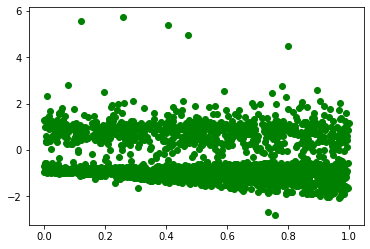

In [ ]:
number_of_points = 2106
x = np.random.uniform(0, 1, size=number_of_points)
mu = 0.0
sigma = 0.1
noise = np.random.normal(loc=mu, scale=sigma, size=number_of_points)

true_a = ds1['H2R']
true_b = ds1['Pressure']
true_c = ds1['MFR']
y = true_a*x + true_c
py.scatter(x, y, color='green')

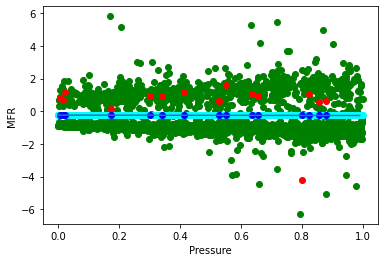

In [ ]:
def generate_data(number_of_points = 2106, true_b = ds1['Pressure'], true_c =  ds1['MFR'], mu = 0.0, sigma = 0.1, degree=1):
  x = np.random.uniform(0, 1, size=number_of_points)
  y = true_b*x**degree + true_c

  return x,y

def create_model(x, y, degree=1):
  # Lots of math magic in here!
  z = np.polyfit(x, y, deg=degree)
  y_hat_function = np.poly1d(z)
  return y_hat_function

def evaluate_model(model, x_train, y_train, x_test, y_test):
  py.scatter(x_train, y_train, color='green')
  py.scatter(x_train, model(x_train), color='cyan')

  py.scatter(x_test, y_test, color='red')
  py.scatter(x_test, model(x_test), color='blue')

  x_on_grid = np.arange(min([min(x_train), min(x_test)]), max([max(x_train), max(x_test)]), 0.01)
  y_predictions_on_grid = model(x_on_grid)

  py.plot(x_on_grid, y_predictions_on_grid)

  py.xlabel('Pressure');
  py.ylabel('MFR');

np.random.seed(123)
number_of_points = 2106
x, y = generate_data(number_of_points = number_of_points, true_b = ds1['Pressure'], true_c =  ds1['MFR'], mu = 0.0, sigma = 0.05, degree=1)

test_size = 15
x_train = x[:(number_of_points-test_size)]
y_train = y[:(number_of_points-test_size)]

x_test = x[(number_of_points-test_size):]
y_test = y[(number_of_points-test_size):]

model = create_model(x_train, y_train, degree=1)
evaluate_model(model, x_train, y_train, x_test=x_test, y_test=y_test)

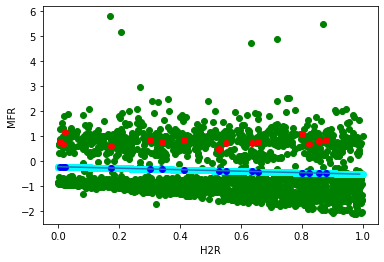

In [ ]:
def generate_data(number_of_points = 2106, true_a = ds1['H2R'], true_c =  ds1['MFR'], mu = 0.0, sigma = 0.1, degree=1):
  x = np.random.uniform(0, 1, size=number_of_points)
  y = true_a*x**degree + true_c

  return x,y

def create_model(x, y, degree=1):
  # Lots of math magic in here!
  z = np.polyfit(x, y, deg=degree)
  y_hat_function = np.poly1d(z)
  return y_hat_function

def evaluate_model(model, x_train, y_train, x_test, y_test):
  py.scatter(x_train, y_train, color='green')
  py.scatter(x_train, model(x_train), color='cyan')

  py.scatter(x_test, y_test, color='red')
  py.scatter(x_test, model(x_test), color='blue')

  x_on_grid = np.arange(min([min(x_train), min(x_test)]), max([max(x_train), max(x_test)]), 0.01)
  y_predictions_on_grid = model(x_on_grid)

  py.plot(x_on_grid, y_predictions_on_grid)

  py.xlabel('H2R');
  py.ylabel('MFR');

np.random.seed(123)
number_of_points = 2106
x, y = generate_data(number_of_points = number_of_points, true_a = ds1['H2R'], true_c =  ds1['MFR'], mu = 0.0, sigma = 0.05, degree=1)

test_size = 15
x_train = x[:(number_of_points-test_size)]
y_train = y[:(number_of_points-test_size)]

x_test = x[(number_of_points-test_size):]
y_test = y[(number_of_points-test_size):]

model = create_model(x_train, y_train, degree=1)
evaluate_model(model, x_train, y_train, x_test=x_test, y_test=y_test)

## **Question 8** (10 points)

Using the trained data to train the linear regression model, and report the results. Do models perform better? Why?

In [ ]:
model = method.fit(train_dropna[['H2R']].to_numpy(),train_dropna['MFR'].to_numpy())
from sklearn.metrics import mean_squared_error
r2 = method.score(test_dropna[['H2R']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['H2R']].to_numpy()), test_dropna['MFR'].to_numpy())

print('R^2: ' + str(r2))
print('mse: ' + str(mse))

R^2: 0.1856638538044687
mse: 21.19870895763556


In [ ]:
method = linear_model.LinearRegression()
model = method.fit(train_processed[['Pressure','H2R']].to_numpy(),train_processed['MFR'].to_numpy())
r2 = method.score(test_processed[['Pressure','H2R']].to_numpy(),test_processed['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_processed[['Pressure','H2R']].to_numpy()), test_processed['MFR'].to_numpy())
print('R^2: ' + str(r2))
print('mse: ' + str(mse))

R^2: 0.12642450114204506
mse: 0.8571498913679115


8 - These models peform better. As shown, our R^2 value is slightly worse, but we have an excellent mse value. Using the modified standard scale improves our prediction.

# More advanced solution

Let's try a count plot to show the number of binned samples of `lnMFR`.

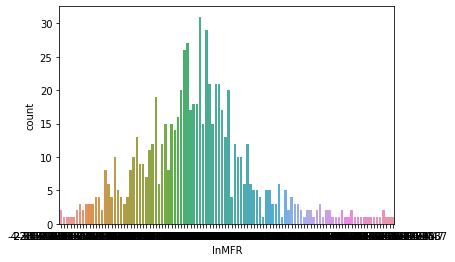

In [ ]:
sns.countplot(x=ds1['lnMFR'])

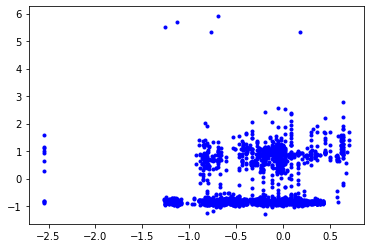

In [ ]:
plt.plot(ds1['H2R'], ds1['MFR'],'b.')

Note the interesting distribution of the data- it has a multimodal Gaussian distribution, in this case with two peaks.

Why not split the data into two parts, one for each Gaussian, then perform regression on each part separately? Will this regression perform better than a single regression algorithm for the full dataset? 

First we split the data into two parts, then make train/test splits of each part with 

In [ ]:
from sklearn.model_selection import train_test_split
lower_data = ds1[ds1['lnMFR']<0]
upper_data = ds1[ds1['lnMFR']>0]
lower_train,lower_test = train_test_split(lower_data, test_size=0.2, shuffle=True,random_state=1)
upper_train,upper_test = train_test_split(upper_data, test_size=0.2, shuffle=True,random_state=1)

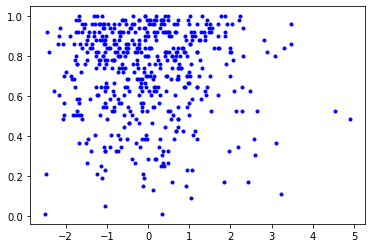

In [ ]:
plt.plot(lower_data['Temp'], lower_data['MFR'],'b.')

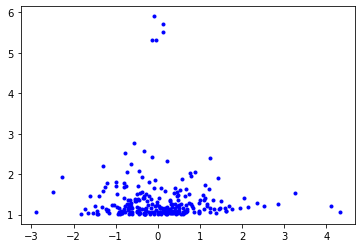

In [ ]:
plt.plot(upper_data['Temp'], upper_data['MFR'],'b.')

Run the following code to test linear regression on the full data set as well as the subsets.

In [ ]:
def fits(data):
    X = ['Temp']
    y = ['MFR']
    # change this if you applied log transformation to your selected variables.
    method = linear_model.LinearRegression()

    model = method.fit(data[X].to_numpy(), data[y].to_numpy())
    
    MFR_pred = method.predict(data[X].to_numpy())
    r2_model = method.score(data[X].to_numpy(),data['lnMFR'].to_numpy())
    mse_model = mean_squared_error(method.predict(data[X].to_numpy()), data['lnMFR'].to_numpy())

    print('R^2: ' + str(r2_model))
    print('mse: ' + str(mse_model))
    
    plt.plot(data[X[0]], data[y],'b.')
    plt.plot(data[X[0]], MFR_pred,'r.')


    return

R^2: -815.1081792475734
mse: 124.42255903441472


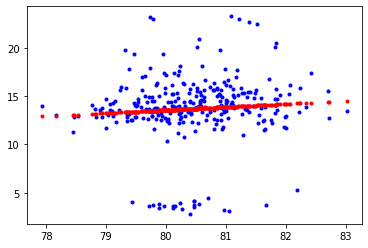

In [ ]:
fits(data)

R^2: -5.369279123174502
mse: 1.5187175299969105


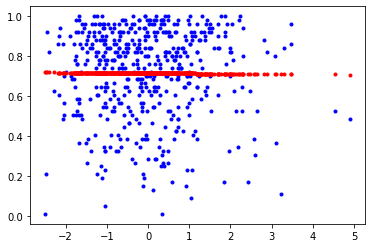

In [ ]:
fits(lower_data)

R^2: -14.104471019369404
mse: 1.3354021258088105


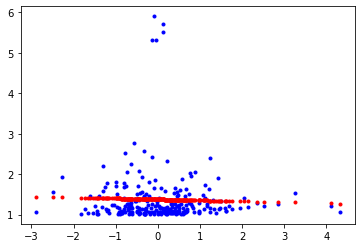

In [ ]:
fits(upper_data)

## **Question 9** (10 points)

Explain what is going on here?  Was it ever a good idea to use linear regression on the whole dataset!?  In particular, what does it mean that the R^2 and mse changed so much? 


9 - It was never a good idea to use linear regression on this data set. It has two sections for which linear regression applies, but this was not a good fit for the whole dataset. This is why the r^2 and mse values changed so drastically. Each subset of the data was actually able to use linear regression. In general, you should only use linear regression on data that is linear. Simply looking at the data beforehand would be a way of identifying this. 



## **Question 10** **($\infty$ points, since this is where you really learn stuff! :-)**

You can get as many points of extra credit as you like by doing a good job with this question!

Play around with doing a better analysis.  Things to try:

1.   Redo the calculations, but start from the split dataset above.
2.   Try different train and test splits and see if the answer changes (i.e., 
```
train_processed,test_processed = train_test_split(ds, test_size=0.2, shuffle=True, random_state=1234)
```
3.   Try different methods such as `linear_model.LinearRegression()`, `KNeighborsRegressor(n_neighbors=20)`, `linear_model.Ridge()`, `linear_model.Lasso()`, or `linear_model.BayesianRidge()`. Can you achieve better performance than any of the previous models? 

4.  Answer the following question carefully:  What is the problem with using this method of selecting a model based on its performance on testing data?


10.4 - None of the models we tested had any real effect on the r^2 or mse values. In fact, most were worse. Selecting a model based on the performance of the test data clearly has a lot of variance and is not very effective. We also had to tune each method to random vaiables we guessed at. This is not an effective way to get an accurate model.

###Split data

In [66]:
from sklearn.model_selection import train_test_split
train,test = train_test_split(ds1, test_size=0.1, train_size = 0.9, shuffle=True, random_state=12)


In [67]:
train.isnull().sum().sum()

1219

###Old Method

In [68]:
model = method.fit(train_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy(),train_dropna['MFR'].to_numpy())
#, 'Pressure', 'Level', 'C2', 'Cat', 'Temp'

In [69]:
from sklearn.metrics import mean_squared_error
r2 = method.score(test_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy()), test_dropna['MFR'].to_numpy())

print('R^2: ' + str(r2))
print('mse: ' + str(mse))

R^2: 0.4262449911995734
mse: 14.935927259730693


###KNeighbors Regressor

In [122]:
from sklearn.neighbors import KNeighborsRegressor
neigh = KNeighborsRegressor(n_neighbors=20)
neigh.fit(train_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy(),train_dropna['MFR'].to_numpy())

KNeighborsRegressor(n_neighbors=20)

In [123]:
from sklearn.metrics import mean_squared_error
r2 = neigh.score(test_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(neigh.predict(test_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy()), test_dropna['MFR'].to_numpy())

print('R^2: ' + str(r2))
print('mse: ' + str(mse))

R^2: 0.27243616945054594
mse: 18.939861584158418


###Bayesian Ridge

In [118]:
from sklearn import linear_model
clf = linear_model.BayesianRidge(n_iter=300, tol=0.001, alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-06, alpha_init=None, lambda_init=None, compute_score=False, fit_intercept=True, normalize='deprecated', copy_X=True, verbose=False)
clf.fit(train_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy(),train_dropna['MFR'].to_numpy())

BayesianRidge()

In [119]:
from sklearn.metrics import mean_squared_error
r2 = clf.score(test_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(clf.predict(test_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy()), test_dropna['MFR'].to_numpy())

print(r2)
print(mse)

0.4258149641494433
14.947121676584478


###Linear Model Lasso

In [116]:

from sklearn import linear_model
clf = linear_model.Lasso(alpha=0.001)
clf.fit(train_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy(),train_dropna['MFR'].to_numpy())

Lasso(alpha=0.001)

In [117]:
from sklearn.metrics import mean_squared_error
r2 = clf.score(test_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(clf.predict(test_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy()), test_dropna['MFR'].to_numpy())

print(r2)
print(mse)

0.4257028566837373
14.95004004579673


###Ridge

In [114]:
from sklearn.linear_model import Ridge
clf = Ridge(alpha=1.0)
clf.fit(train_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy(),train_dropna['MFR'].to_numpy())

Ridge()

In [115]:
from sklearn.metrics import mean_squared_error
r2 = clf.score(test_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(clf.predict(test_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy()), test_dropna['MFR'].to_numpy())

print(r2)
print(mse)

0.4163546312623043
15.19339202139692
